<a href="https://colab.research.google.com/github/Francisroyce/Francisroyce/blob/main/Dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ⏰ End-to-end multi-class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

# 1. Problem
Identifying the breed of a dog given an image of the dog

# 2. Data
The Data we're using is from kaggle's dog breed identification competition.

# 3. Evaluation
The evaluation is a file with prediction probabilities for each breed of each image.

# 4. Features
Some information about the data:
* we're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classese).
* There are around 10,00+ images in the training set (these images have labels).
* There are around 10,00+ images in the test set (these images have no labels, because we'll want to predict them).

In [120]:
# unzip the uploaded data into Google Drive
# !unzip 'drive/MyDrive/Dog vision/dog-breed-identification.zip' -d 'drive/MyDrive/Dog vision/'

# Get our workspace ready
* Import new version of tensorflow(mine already existed)
* import tensorflow hub
* make sure we're using GPU

In [121]:
# import Tensorflow into Colab
import tensorflow_hub as hub
import tensorflow as tf
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# check for GPU availability
print('GPU', 'available (YESSSS!!!!!!)' if tf.config.list_physical_devices('GPU') else 'not available : ()')

TF version: 2.12.0
TF Hub version: 0.13.0
GPU available (YESSSS!!!!!!)


# Getting our data ready (turning into Tensors)
with all machine learning models, our data has to be in numerical format. so that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.



In [122]:
# checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Dog vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [123]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [124]:
# How many images are there of each breed?
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

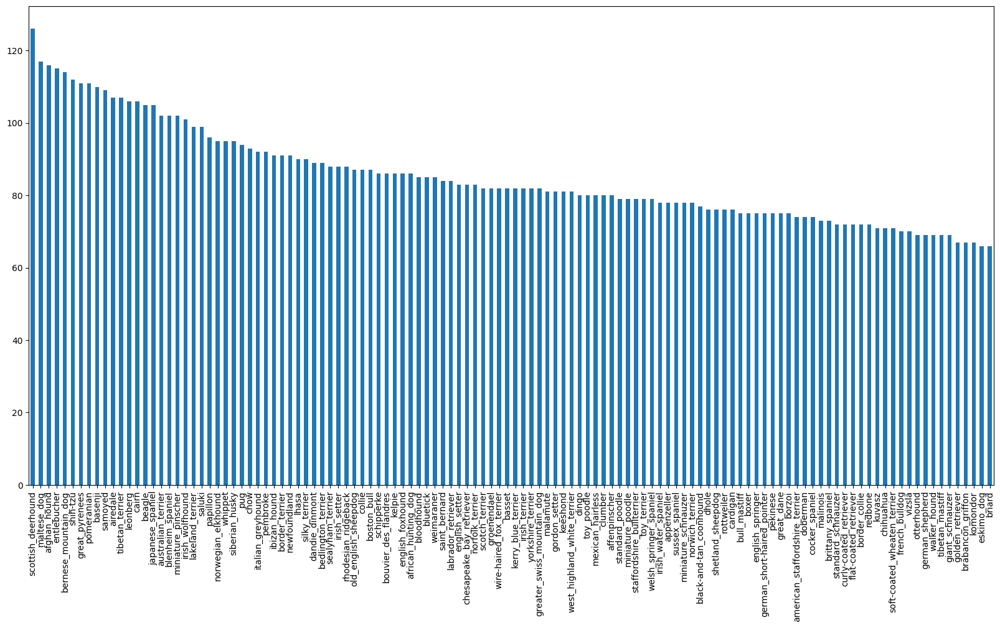

In [125]:
labels_csv['breed'].value_counts().plot.bar(figsize =(20, 10));

In [126]:
labels_csv['breed'].value_counts().median()

82.0

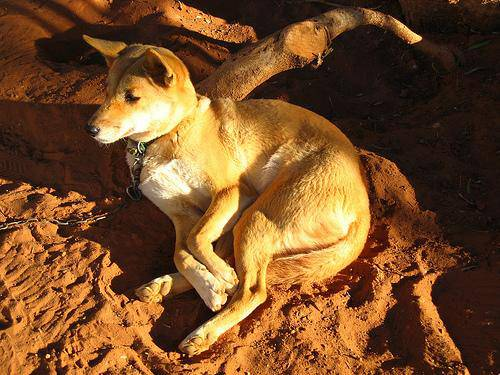

In [127]:
# let's view an image
from IPython.display import Image
Image('drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

# Getting images and their labels

let's get a list of all of our image file pathnames.

In [128]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [129]:
# Create pathnames from image ID's
filenames = ['drive/MyDrive/Dog vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

# check the first 10
filenames[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [130]:
import os
os.listdir('drive/MyDrive/Dog vision/train/')[:10]

['e4a159a9611f2025cecf53bf8e09699b.jpg',
 'e681969d4b5b730e9c93ce5e9d9ec9ff.jpg',
 'e49b6c0fb5b8bb8b86fe2a1f48c65746.jpg',
 'e94234a15721850c8aaf3a94d2363f4f.jpg',
 'dd19ba0779065dbab0c28842fdf5851f.jpg',
 'e12c6bc13e4ab1de4dd12d21ce74eefe.jpg',
 'e8827c1b0698e56e60f735b142d69d18.jpg',
 'e2164f0cb48f319ce4e7ca70d82d8754.jpg',
 'e4fe0acc8e0372aae5d0b0817e70bdef.jpg',
 'e6cdf82e11fd0ee6f73c55c0b4944616.jpg']

In [131]:
# check whether number of filenmaes matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog vision/train/')) == len(filenames):
  print('Filenames match actual amount of files!!! Proceed.')
else:
  print('Filenames do not match actual amount of files, check the target directory.')

Filenames match actual amount of files!!! Proceed.


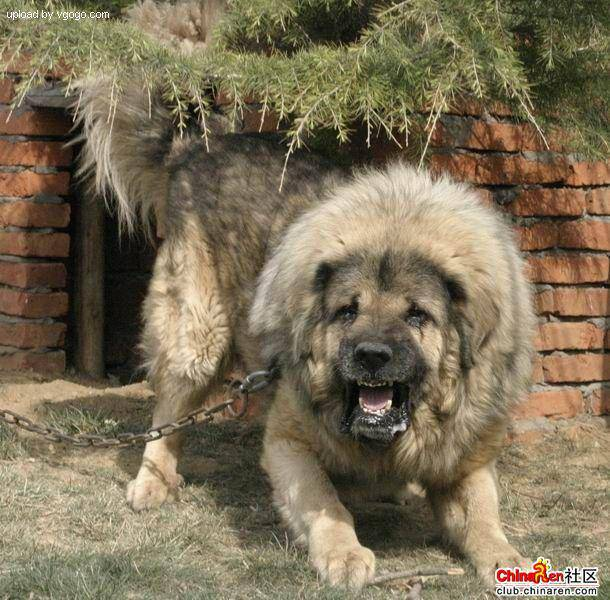

In [132]:
# one more check
Image(filenames[9000])

In [133]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [134]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [135]:
len(labels)

10222

In [136]:
# see if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames')
else:
  print('Number of labels does not match number of filenames, check data directories!')

Number of labels matches number of filenames


In [137]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [138]:
len(unique_breeds)

120

In [139]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [140]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [141]:
len(labels)

10222

In [142]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [143]:
len(boolean_labels)

10222

In [144]:
# Example Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample labels occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


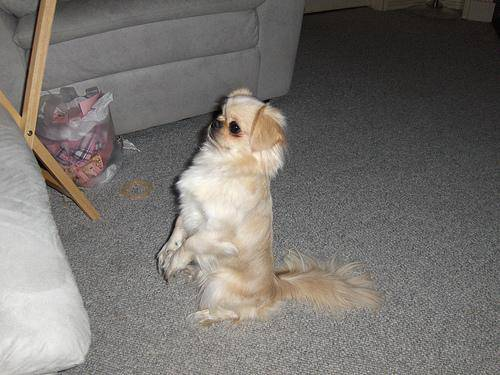

In [145]:
Image(filenames[2])

In [146]:
labels_csv['breed'][2]

'pekinese'

In [147]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [148]:
filenames[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [149]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

# Creating our validation set.

Since the dataset from kaggle doesn't come with a validation set, we're going to create our own

In [150]:
# setup x and y variables

x = filenames
y = boolean_labels

In [151]:
len(filenames)

10222

we're going to start off experimenting with 1000 images and increase as needed.

In [152]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [153]:
# let's split our data into train and validaation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUm_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                 test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [154]:
# let's have a geez at the training data
x_train[:5], y_train[:2]

(['drive/MyDrive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

# Preprocessing images (turning images into Tensors).

To preprocess our images into Tensors we're going to write a function  which does a few things:

1. Take an image filepath as input
2. use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. resize the `image` to be shape of (224, 224)
5. return the modified `image`

Before we do, let's see what importing an image looks like


In [155]:
# convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [156]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [157]:
image.max(), image.min()

(255, 0)

In [158]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [159]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to  preprocess them.



1. Take an image filepath as input
2. use Tensorflow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1.
5. resize the image to be shape of (224, 224)
6. return the modified image

In [160]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # convert thee colour channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

# Turning our data into batches

why turn our data into batches?

let's say you're trying to process 10, 000+ images into one go... they all might not fit into memory.

so that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [161]:
# create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):

  '''
  Takes an image file path name and the associated label, process the image and
   returns a tuple of (image, label).
  '''
  image = process_image(image_path)
  return image, label

In [162]:
# Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuple of Tensors in the form `(image, label)`, let's make a function to turn all of our data (x and y) into batches!

In [163]:
# define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  '''
  crate batches of data out of image (x) and label (y) pairs.
  shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no lables).
  '''
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) #only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
      print('Creating validation data batches...')
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                                tf.constant(y))) # labels
      data_batch = data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch
  
  else:
    print('Create training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(x))

    # create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch
    


In [164]:
# create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Create training data batches...
Creating validation data batches...


In [165]:
# check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches

our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [166]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Disolay a plot of 25 images and their labels from a data batch
  '''
  # setup the figure
  plt.figure(figsize = (10, 10))
  # loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots (5 rowa, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn thee grid lines off
    plt.axis('off')

In [167]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [168]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[3.08210813e-02, 6.21936284e-02, 1.90563742e-02],
          [3.77498679e-02, 6.91224188e-02, 2.59851627e-02],
          [4.22268920e-02, 7.35994428e-02, 3.04621868e-02],
          ...,
          [1.85028136e-01, 2.08557546e-01, 2.00714409e-01],
          [1.75498545e-01, 1.99027970e-01, 1.91184819e-01],
          [1.50273040e-01, 1.73802465e-01, 1.65959328e-01]],
 
         [[3.27770971e-02, 6.02280796e-02, 2.88555287e-02],
          [3.81565131e-02, 6.56074956e-02, 3.42349447e-02],
          [4.32622284e-02, 7.07132146e-02, 3.93406600e-02],
          ...,
          [2.25166172e-01, 2.48695582e-01, 2.40852445e-01],
          [2.25069791e-01, 2.48599216e-01, 2.40756080e-01],
          [1.84228286e-01, 2.07757697e-01, 1.99914560e-01]],
 
         [[5.00262640e-02, 7.74772465e-02, 4.64198217e-02],
          [4.15640473e-02, 6.90150335e-02, 3.79576087e-02],
          [3.41157578e-02, 6.15667403e-02, 3.05093192e-02],
          ...,
          [1.83779523e-01, 2.07308933e-01, 1.9946

In [169]:
len(train_images), len(train_labels)

(32, 32)

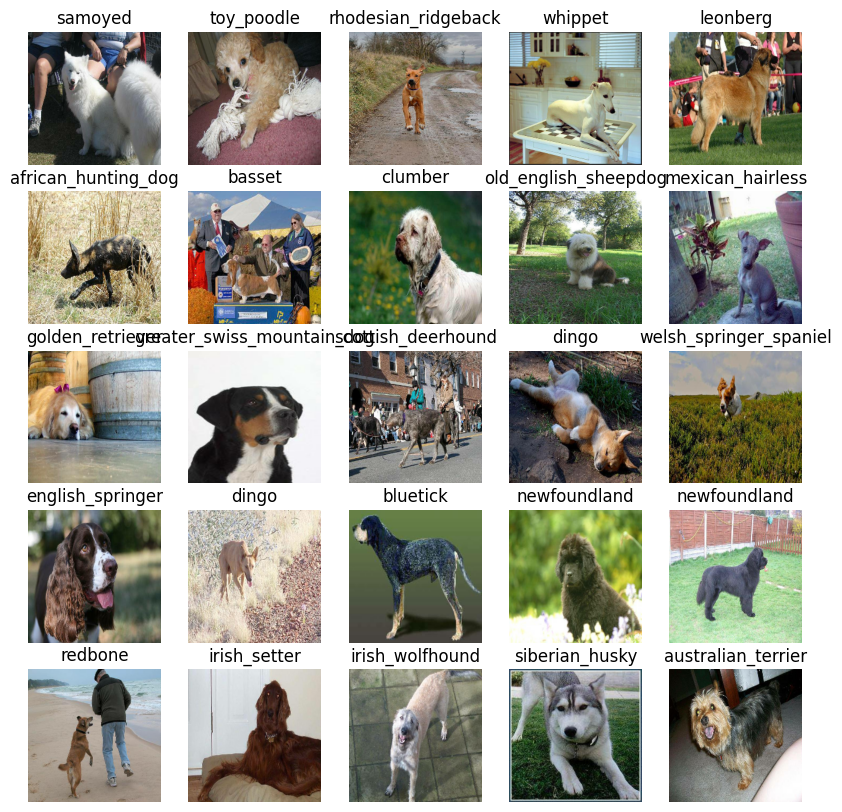

In [170]:
# now let"s visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

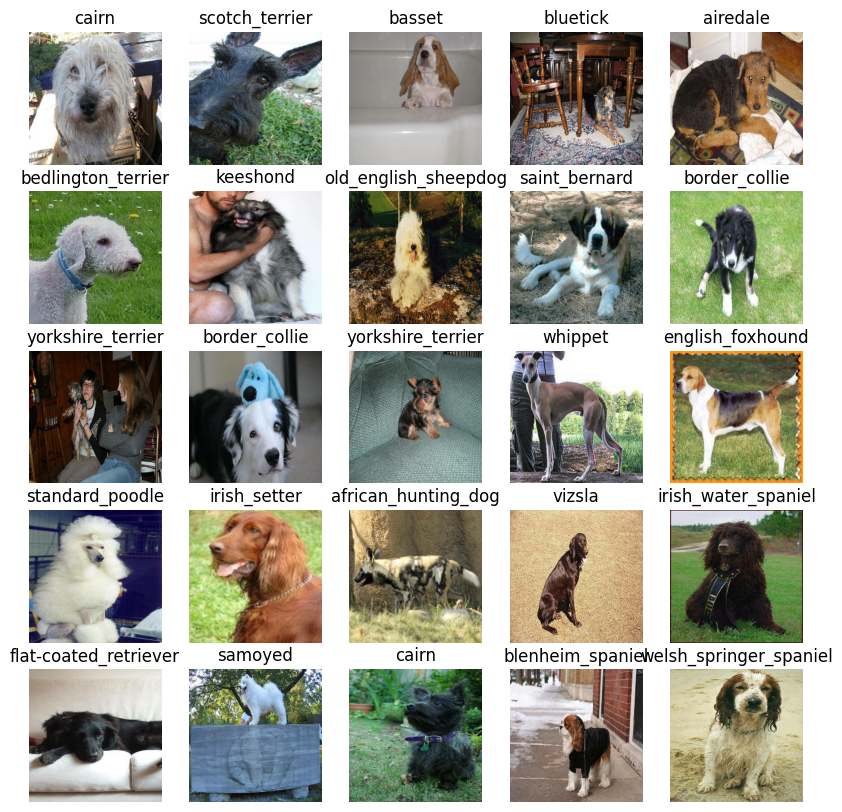

In [171]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The outputr shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub -https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5

In [172]:
IMG_SIZE

224

In [173]:
# setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5'

Now we've got our inputs, outputs and model ready to go.
Let's put the together into a keras deep learning  model!

knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
*Defines the layers in a keras model in sequential fashion (do this first, then this, the that)
* Compile the model (says it should be evaluated and improved).
* Build the model (tells the model the input shape it'll be getting
* Return the model.

In [174]:
# create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with:', MODEL_URL)


  # Setup the model layers
  model = tf.keras.Sequential([
     hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
     tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation='softmax') # layer 2 (output layer)
  ])
  # compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [175]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              6158505   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 6,278,745
Trainable params: 120,240
Non-trainable params: 6,158,505
_________________________________________________________________


In [176]:
INPUT_SHAPE

[None, 224, 224, 3]

In [177]:
OUTPUT_SHAPE

120

In [178]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_5 (KerasLayer)  (None, 1001)              6158505   
                                                                 
 dense_5 (Dense)             (None, 120)               120240    
                                                                 
Total params: 6,278,745
Trainable params: 120,240
Non-trainable params: 6,158,505
_________________________________________________________________


# creating callbacks

callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

we'll create two callbacks, one fro TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

# TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. load the TensorBoard notebook extension
2. create a TensorBoard callback which is able to save logs
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [179]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [180]:
import os
import datetime
import tensorflow as tf

# create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Dog vision/logs',
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


# Early stopping callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.


https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [181]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 3)

# Training a model (on subset of data)

our first model is only going to traing on 1000 images, to make sure everything is working.

In [182]:
NUM_EPOCHS = 100 #@param {type: 'slider', min:10, max:100, step:10}

In [183]:
# chedck to make sure we'll still runing on a GPU
print('GPU', 'available (YESSSS!!!)' if tf.config.list_physical_devices('GPU')else 'not available : (')

GPU available (YESSSS!!!)


let's create a function which trains a model.

* create a model using `create_model()`
* setup a TensorBoard callback using `create_tensorboard_callback()`
* call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* return the model

In [184]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and retuns the trained version.
  '''
  # create a model
  model = create_model()

  # create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  # return the fitted model
  return model


In [185]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Epoch 1/100
25/25 [==============================] - 13s 324ms/step - loss: 4.5754 - accuracy: 0.1063 - val_loss: 3.2719 - val_accuracy: 0.3200
Epoch 2/100
25/25 [==============================] - 4s 150ms/step - loss: 1.6592 - accuracy: 0.6812 - val_loss: 2.1116 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 4s 149ms/step - loss: 0.5565 - accuracy: 0.9400 - val_loss: 1.6158 - val_accuracy: 0.6500
Epoch 4/100
25/25 [==============================] - 5s 177ms/step - loss: 0.2453 - accuracy: 0.9912 - val_loss: 1.4431 - val_accuracy: 0.6700
Epoch 5/100
25/25 [==============================] - 4s 159ms/step - loss: 0.1415 - accuracy: 1.0000 - val_loss: 1.3641 - val_accuracy: 0.6900
Epoch 6/100
25/25 [==============================] - 4s 147ms/step - loss: 0.0977 - accuracy: 1.0000 - val_loss: 1.3179 - val_accuracy: 0.6950
Epoch 7/100
25/25 [=============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks.

**Note** Overfiiting to begin with is a good thing! it means our model is learning!!!

# Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its content

In [186]:
%tensorboard --logdir=drive/MyDrive/Dog\ vision/logs


Reusing TensorBoard on port 6006 (pid 11615), started 0:23:49 ago. (Use '!kill 11615' to kill it.)

<IPython.core.display.Javascript object>

# Making and evaluating predictions using a trained model

In [187]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [188]:
# make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 174ms/step


array([[3.0134928e-03, 9.1977365e-04, 6.7240983e-04, ..., 2.6418900e-04,
        5.1467538e-05, 1.4262535e-03],
       [1.8701287e-03, 1.0983063e-03, 1.6251570e-03, ..., 2.8914101e-03,
        7.9768186e-04, 2.1134448e-04],
       [1.2549119e-05, 9.7264192e-06, 2.9984748e-04, ..., 4.5148037e-05,
        5.5720484e-06, 5.3895041e-05],
       ...,
       [3.0150841e-05, 3.5254448e-03, 1.1524863e-03, ..., 9.1055647e-04,
        2.5997215e-04, 4.7329484e-04],
       [1.9363761e-04, 3.3432778e-05, 1.0743347e-05, ..., 3.4299916e-05,
        8.1982253e-05, 3.6459725e-04],
       [7.7948277e-04, 5.0414666e-05, 1.2985800e-04, ..., 1.9649087e-02,
        6.5867568e-04, 1.8228892e-04]], dtype=float32)

In [189]:
predictions.shape

(200, 120)

In [190]:
np.sum(predictions[0])

0.99999994

In [191]:
predictions[0]

array([3.0134928e-03, 9.1977365e-04, 6.7240983e-04, 7.3429418e-04,
       2.6271434e-04, 3.6849463e-04, 1.2936319e-02, 3.3284511e-04,
       9.3257724e-04, 5.7323836e-04, 1.7243183e-03, 9.3860974e-05,
       2.4542178e-04, 4.0570067e-04, 1.8708051e-05, 1.9989998e-04,
       3.6855610e-05, 3.1759370e-02, 1.6737188e-04, 1.3379647e-05,
       3.9187390e-03, 2.6768533e-04, 8.6244771e-05, 1.1925099e-02,
       7.9798947e-06, 3.2157855e-04, 3.9180216e-01, 1.4596709e-04,
       1.8628179e-03, 1.5442383e-03, 1.3190790e-03, 3.0747624e-04,
       7.3186748e-05, 1.5937393e-04, 1.0714523e-03, 5.8352366e-02,
       3.4180842e-04, 1.9427194e-05, 1.4648956e-03, 5.8845721e-06,
       2.9142748e-04, 1.2889490e-04, 6.3799869e-04, 1.3960472e-04,
       2.1349952e-05, 3.6182371e-04, 1.6439435e-04, 1.7260194e-04,
       6.7044850e-03, 2.1749281e-04, 2.3877324e-04, 2.3168688e-04,
       1.0582280e-03, 3.7372421e-04, 2.4343502e-04, 8.5837855e-05,
       2.3986226e-04, 2.4093289e-03, 1.6025265e-04, 4.8490904e

In [192]:
# First prediction
index = 42
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[3.84003826e-04 1.18617783e-04 1.86969322e-04 7.15789793e-05
 6.03667868e-04 5.75360646e-05 2.39857691e-04 2.44291802e-03
 4.34198827e-02 2.77932268e-02 2.61929290e-05 3.28604692e-05
 6.17972168e-04 2.54365243e-03 2.71254196e-03 4.70960885e-03
 1.52451539e-04 2.23737763e-04 2.55671213e-04 4.25052858e-04
 5.00640133e-04 2.54797260e-03 3.24165194e-05 7.63585995e-05
 1.45993102e-02 4.43241479e-05 6.40083599e-05 1.96851877e-04
 7.98963083e-05 2.52710615e-05 3.12220916e-04 5.16209075e-05
 4.10442619e-04 1.27700114e-04 3.37232450e-05 7.72977437e-05
 4.29707616e-05 8.69572279e-04 1.48990599e-04 1.31322294e-01
 3.06284230e-04 9.58062737e-05 5.83411148e-03 5.06418291e-05
 5.15937631e-04 4.16660114e-05 6.53996947e-04 6.05768175e-04
 1.24262617e-04 3.61486222e-04 1.51541230e-04 1.66599682e-04
 7.55844580e-04 2.94516358e-04 1.23295002e-04 1.63858174e-03
 6.54377873e-05 1.74718316e-05 2.27825323e-04 3.66396307e-05
 1.90139646e-04 1.29041873e-04 1.99600909e-04 1.46616467e-05
 1.35475333e-04 1.001341

In [193]:
unique_breeds[39]

'english_foxhound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** preditcion probabilities are also known as confidence levels.

In [194]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probability into labels.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

  # get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'cardigan'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images then compare those predictions to the validation labels (truth laabels)

In [195]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [196]:
# create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of imagees and label,

  '''
  images = []
  labels = []
  # loop through unbatch data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [197]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* prediction labels
* validation labels (truth lables)
* validation images

let's make some function to make these all a bit more visualize.

we'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [198]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  view the prediction, ground truth and image for sample n
  '''
  pred_prob, truth_label, image = prediction_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the color of the title depending on if the prediction is right or wrong
  if pred_label == truth_label:
    color = 'green'
  else:
    color = 'red'

  # change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    truth_label),
                                    color = color)


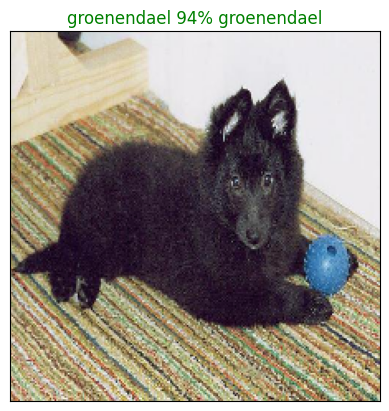

In [199]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n = 77)

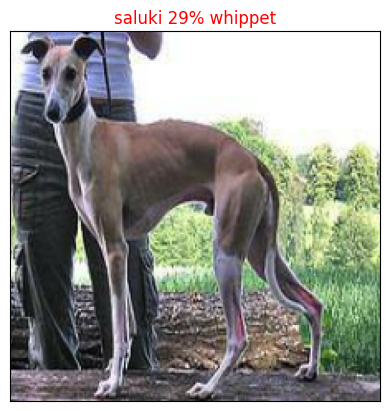

In [200]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n = 13) # red title means it predicted wrongly

Now wer've got one function to visualize our model top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * prediction probabilities indexes
  * prediction probabilities values
  * prediction labels
* plot the top 10 prediction probability values and labels, coloring the true label green

In [201]:
def plot_pred_conf(prediction_probabilities,labels, n=1):
  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidences values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')
  
  # change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass
  



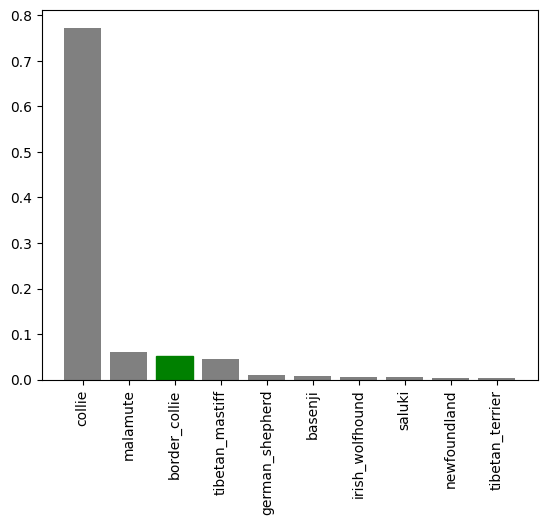

In [202]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n = 9)

Now we've goet some function to help us visualize our predictions and evaluate our model, let's check out a few.

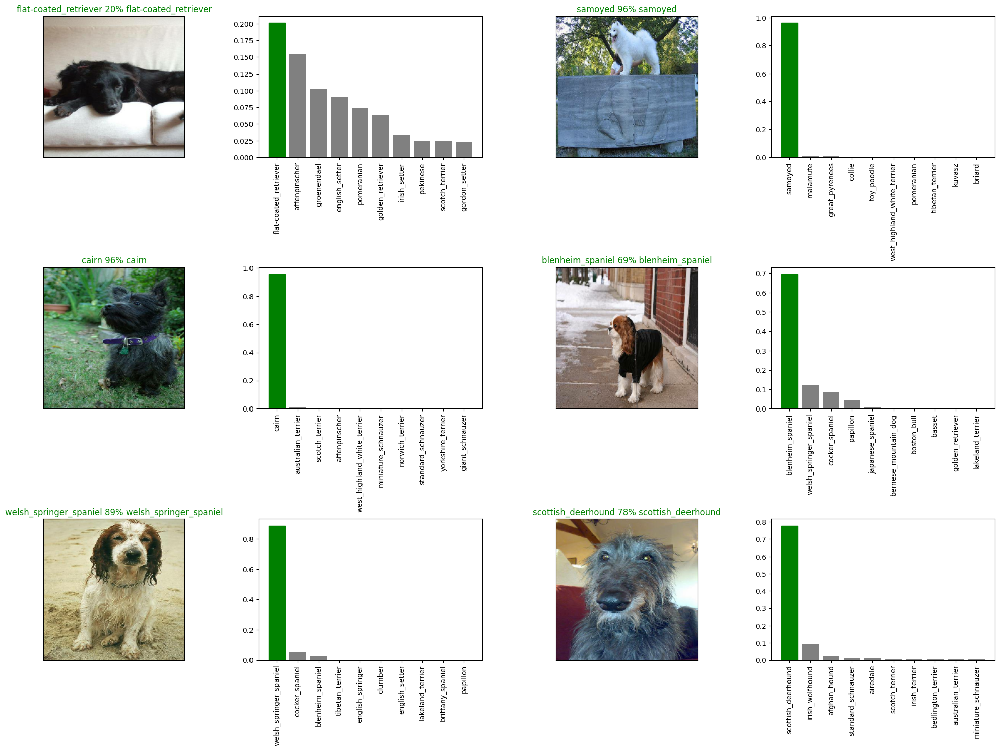

In [203]:
# let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a trained model

In [204]:
# Create a function to save a model
def save_model(model, suffix = None):
  '''
  saves a given model in a model directory and appends a suffix (string).
  '''
  # create a model directory pathname with current
  modeldir = os.path.join('drive/MyDrive/Dog vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [205]:
# create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {'KerasLayer': hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [206]:
# save our model trained on 1000 images
save_model(model, suffix ='1000-images-mobilenet2-Adam')

saving model to: drive/MyDrive/Dog vision/models/20230508-13151683551746-1000-images-mobilenet2-Adam.h5...


'drive/MyDrive/Dog vision/models/20230508-13151683551746-1000-images-mobilenet2-Adam.h5'

In [207]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog vision/models/20230505-12431683290614-1000-images-mobilenet2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog vision/models/20230505-12431683290614-1000-images-mobilenet2-Adam.h5


In [208]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 79ms/step - loss: 1.2317 - accuracy: 0.7000


[1.231717586517334, 0.699999988079071]

In [209]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 88ms/step - loss: 1.2608 - accuracy: 0.7100


[1.2607717514038086, 0.7099999785423279]

# Training a big dog model (on t5he full data)

In [210]:
len(x), len(y)

(10222, 10222)

In [211]:
x[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [212]:
x_train[:10]

['drive/MyDrive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/MyDrive/Dog vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/MyDrive/Dog vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/MyDrive/Dog vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/MyDrive/Dog vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/MyDrive/Dog vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [213]:
len(x_train) # our model has only been trained on 800 images

800

In [214]:
y[:2]  # label that associated in each filepath

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [215]:
# create a data batch with the full data set
full_data = create_data_batches(x, y)

Create training data batches...


In [216]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [217]:
# create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5


In [218]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                             patience = 3)

**Note:** Running the cell below will take a little while (maybe up to minutes for the first epoch) becauses the GPU we're using in the runtime has to load all of the images into memory.

In [219]:
# fit the full model to the data
full_model.fit(x =full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 108ms/step - loss: 1.3112 - accuracy: 0.6807
Epoch 2/100
320/320 [==============================] - 34s 107ms/step - loss: 0.3574 - accuracy: 0.8967
Epoch 3/100
320/320 [==============================] - 37s 114ms/step - loss: 0.2045 - accuracy: 0.9465
Epoch 4/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1316 - accuracy: 0.9706
Epoch 5/100
320/320 [==============================] - 36s 112ms/step - loss: 0.0893 - accuracy: 0.9839
Epoch 6/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0642 - accuracy: 0.9908
Epoch 7/100
320/320 [==============================] - 36s 112ms/step - loss: 0.0480 - accuracy: 0.9943
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0368 - accuracy: 0.9971
Epoch 9/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0296 - accuracy: 0.9976
Epoch 10/100
320/320 [==============================] - 34s 107m

In [220]:
save_model(full_model, suffix = 'full-image-set-mobilenetv2-Adaam')

saving model to: drive/MyDrive/Dog vision/models/20230508-13261683552386-full-image-set-mobilenetv2-Adaam.h5...


'drive/MyDrive/Dog vision/models/20230508-13261683552386-full-image-set-mobilenetv2-Adaam.h5'

In [221]:
# laod in the full model
loaded_full_model = load_model('drive/MyDrive/Dog vision/models/20230505-14091683295750-full-image-set-mobilenetv2-Adaam.h5')

Loading saved model from: drive/MyDrive/Dog vision/models/20230505-14091683295750-full-image-set-mobilenetv2-Adaam.h5


In [222]:
len(x)

10222

# making preditions on the test dataset

since our model has been trained on images in the forms of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a prediction array by passing the test batches to the `predict()` method called on pour model


In [223]:
# Load test image filenames
test_path = 'drive/MyDrive/Dog vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog vision/test/e64296ffbae301f86c8728834c507cb6.jpg',
 'drive/MyDrive/Dog vision/test/e2a6dfb8127f801af0626f245f35441e.jpg',
 'drive/MyDrive/Dog vision/test/e5ba665e01b6927411d60158f28160dd.jpg',
 'drive/MyDrive/Dog vision/test/e4fc0f20883984209dd64dff54dc89a0.jpg',
 'drive/MyDrive/Dog vision/test/e1b9b0a95a4c7a3c4f3a3a8622314d37.jpg',
 'drive/MyDrive/Dog vision/test/de5496c6b58f66ab890ab24087d9e220.jpg',
 'drive/MyDrive/Dog vision/test/e0c767bc2bc03b909526f1861c712b13.jpg',
 'drive/MyDrive/Dog vision/test/de3fbd6fb5444fcf14390ac90545c2f1.jpg',
 'drive/MyDrive/Dog vision/test/e3f04efb648b110b2eb04b9c041504d8.jpg',
 'drive/MyDrive/Dog vision/test/e53b2f4211fb7a34aeaa04974b919f6d.jpg']

In [224]:
len(test_filenames)

10357

In [225]:
# create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [226]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note** calling `predict()` on our full model and passing it the test data batch wwill take a long time to run (about an 1 hour)

In [227]:
# make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 41s 124ms/step


In [228]:
# save predictions (NumPy array) to csv file (for access later)
np.savetxt('drive/MyDrive/Dog vision/preds_array.csv', test_predictions, delimiter =',')

In [229]:
test_predictions = np.loadtxt('drive/MyDrive/Dog vision/preds_array.csv', delimiter =',')

In [230]:
test_predictions[:10]

array([[6.92143522e-06, 9.99836759e-12, 3.42743056e-10, ...,
        1.07861784e-11, 1.84652016e-11, 1.97042660e-11],
       [8.10179035e-10, 1.47055301e-08, 5.11289344e-10, ...,
        2.07963478e-08, 9.80208993e-01, 1.77250726e-07],
       [1.04583215e-12, 9.86741869e-11, 9.99982953e-01, ...,
        3.84393045e-10, 5.51168937e-11, 2.76982257e-12],
       ...,
       [1.46100438e-08, 5.59926671e-12, 3.84967030e-10, ...,
        7.84371059e-06, 3.43805950e-05, 2.71568618e-12],
       [3.29292461e-11, 8.73156714e-10, 3.68435371e-13, ...,
        3.77871752e-13, 2.82927499e-06, 2.83338695e-12],
       [3.75545125e-12, 9.99999046e-01, 4.66846249e-11, ...,
        2.78456952e-10, 2.15322118e-11, 9.00376662e-10]])

In [231]:
test_predictions.shape

(10357, 120)

# Preparing test dataset predictions for kaggle
looking at the kaggle sample submissin, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a columns for each diffetent dog breeds.

To get the data in this format, we'll:
* Create a pandas Dataframe with an ID column as well as a column for each dog breed.
* Add data to ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export Dataframe as a CSV to submit it to kaggle.

In [232]:
# ['id'] + list(unique_breeds)

In [233]:
# create a pandas Dataframe with empty columns
pred_df = pd.DataFrame(columns = ['id'] + list(unique_breeds))
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [234]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
pred_df['id'] = test_ids

In [235]:
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e64296ffbae301f86c8728834c507cb6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e2a6dfb8127f801af0626f245f35441e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5ba665e01b6927411d60158f28160dd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4fc0f20883984209dd64dff54dc89a0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1b9b0a95a4c7a3c4f3a3a8622314d37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [236]:
# Add the prediction probabilities to each dog breed column
pred_df[list(unique_breeds)] = test_predictions
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e64296ffbae301f86c8728834c507cb6,6.921435e-06,9.998368e-12,3.427431e-10,5.014851e-09,5.832065e-11,5.552026e-12,8.105802e-10,1.558209e-11,1.727555e-12,...,8.906393e-09,6.841965e-12,1.429877e-08,9.202811e-09,5.165564e-11,5.995197e-12,4.151900e-10,1.078618e-11,1.846520e-11,1.970427e-11
1,e2a6dfb8127f801af0626f245f35441e,8.101790e-10,1.470553e-08,5.112893e-10,1.053312e-06,1.459936e-08,2.024360e-10,1.074127e-07,8.242142e-07,9.286919e-11,...,2.863987e-08,9.079985e-09,3.791940e-11,5.826929e-09,4.966866e-10,1.237366e-08,2.707441e-05,2.079635e-08,9.802090e-01,1.772507e-07
2,e5ba665e01b6927411d60158f28160dd,1.045832e-12,9.867419e-11,9.999830e-01,1.401673e-13,3.292171e-12,1.168204e-13,1.766118e-09,4.355327e-11,2.411656e-12,...,9.321170e-12,4.452096e-09,2.350271e-11,3.899127e-14,1.164376e-12,8.476220e-11,7.809649e-13,3.843930e-10,5.511689e-11,2.769823e-12
3,e4fc0f20883984209dd64dff54dc89a0,2.173369e-07,1.005771e-06,7.780127e-09,3.384024e-07,3.326191e-09,8.224566e-10,7.779464e-04,3.939775e-10,7.249493e-10,...,4.099946e-10,7.488086e-09,3.579930e-08,1.815968e-09,9.191947e-10,3.133155e-08,1.086513e-08,6.418859e-07,2.107047e-06,1.161792e-04
4,e1b9b0a95a4c7a3c4f3a3a8622314d37,6.405899e-09,1.105375e-06,1.163080e-04,8.615688e-04,3.277449e-06,5.236191e-02,1.531896e-04,7.758977e-06,8.306478e-05,...,5.458952e-07,6.048848e-08,1.375077e-06,1.722352e-04,8.684832e-04,1.567402e-05,1.565347e-07,6.425725e-05,3.716033e-08,2.285188e-09


In [237]:
# save our prediction dataframe to csv for submission to kaggle
pred_df.to_csv('drive/MyDrive/Dog vision/full_model_dog_breed_predictions_1mobilenetv2.csv',
               index = False)

# making prediction on custom images
To make predictions on custom images, we'll:

* Get the filepath of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. and since pur custom images won't have labels, we set the `test_data` parameter to `True`.
* pass the custom image data batch to our model's `predict()` method.
* convert the prediction output probabilities to predictions labes.
* ompare the predicted labels to the custom images

In [252]:
# Get custom image filepath
custom_path = 'drive/MyDrive/Dog vision/dog/'
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [253]:
custom_image_path

['drive/MyDrive/Dog vision/dog/IMG-20230508-WA0002.jpg',
 'drive/MyDrive/Dog vision/dog/IMG-20230508-WA0001.jpg',
 'drive/MyDrive/Dog vision/dog/IMG-20230508-WA0000.jpg']

In [254]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_path, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [255]:
# make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [256]:
custom_preds

array([[8.25199834e-07, 5.95203301e-06, 1.15180501e-06, 1.30259623e-05,
        2.11092033e-08, 1.39621034e-06, 2.89410382e-05, 2.75402621e-04,
        2.31380604e-09, 3.18760023e-04, 1.43765760e-07, 1.07238964e-08,
        9.92581239e-10, 3.34481433e-06, 5.26894048e-08, 1.70785104e-04,
        2.00596062e-07, 9.28119698e-04, 6.31480368e-10, 3.04819032e-08,
        1.95876123e-06, 6.10440642e-10, 8.09444009e-06, 6.84634870e-05,
        7.77688547e-05, 1.31647414e-06, 1.60232076e-08, 1.40957113e-07,
        9.57765337e-07, 3.56732869e-07, 9.75340910e-08, 2.78920531e-09,
        1.58576006e-06, 1.07055661e-04, 1.43545114e-08, 1.51034453e-06,
        5.53718991e-08, 6.37416298e-09, 8.50461590e-10, 6.59050595e-04,
        5.65001073e-06, 1.44013245e-06, 2.70614037e-05, 7.74951445e-07,
        3.50524999e-07, 8.02912736e-10, 3.97262795e-07, 4.10320695e-07,
        4.67318462e-10, 3.71821021e-04, 1.00964735e-06, 7.55950680e-09,
        1.61135522e-05, 1.52274112e-07, 1.66604661e-10, 1.832089

In [257]:
custom_preds.shape

(3, 120)

In [258]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range (len(custom_preds))]
custom_pred_labels

['yorkshire_terrier', 'rottweiler', 'malamute']

In [259]:
# get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images =[]
# loop through unbatch data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

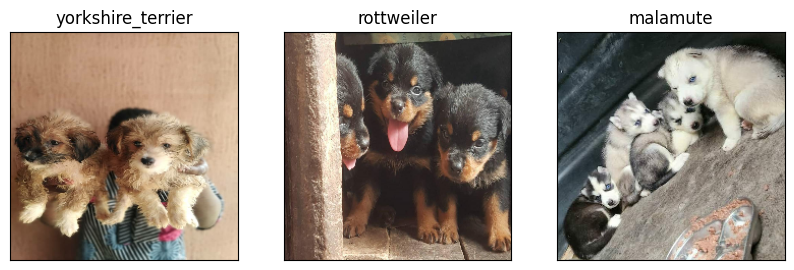

In [262]:
# check custom image prediction
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
